# **Customer Segmentation (Customer Dataset)**
---

### Produced By: Kaung Myat San (DAAA/FT/1B/03)
### Date: 13.1.2025

## **Probelm Statement**
---
Building a model that will segments the customer effectively into different group to allow us to cater to each group's needs.



# Importing Modules
---

In [126]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from itertools import product
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import textwrap
from matplotlib.colors import ListedColormap

### Importing Models

In [127]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, MeanShift, SpectralClustering, OPTICS, AffinityPropagation, Birch
from sklearn.mixture import GaussianMixture

# **Loading Data**
---

In [128]:
customer = pd.read_csv("CA2-Customer-Data.csv")

# **Background Research**
---

In [129]:
customer.head()

,CustomerID,Gender,Age,Income (k$),How Much They Spend
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40


In [130]:
customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   CustomerID           200 non-null    int64 
 1   Gender               200 non-null    object
 2   Age                  200 non-null    int64 
 3   Income (k$)          200 non-null    int64 
 4   How Much They Spend  200 non-null    int64 
dtypes: int64(4), object(1)
memory usage: 7.9+ KB


In [131]:
customer.describe()

,CustomerID,Age,Income (k$),How Much They Spend
count,200.000000,200.000000,200.000000,200.000000
mean,100.500000,38.850000,60.560000,50.200000
std,57.879185,13.969007,26.264721,25.823522
min,1.000000,18.000000,15.000000,1.000000
25%,50.750000,28.750000,41.500000,34.750000
50%,100.500000,36.000000,61.500000,50.000000
75%,150.250000,49.000000,78.000000,73.000000
max,200.000000,70.000000,137.000000,99.000000


# **Data Exploration**
---

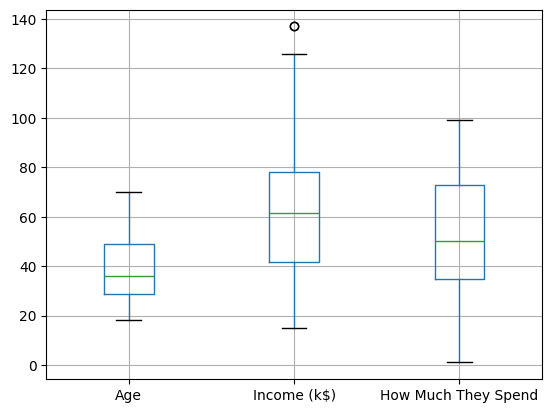

In [132]:
customer.boxplot(column=[ "Age", "Income (k$)", "How Much They Spend"])
plt.show()

From looking at the boxplot, there seems to be an outlier in Income (k$), therefore I will be removing it.

In [133]:
max_income_index = customer["Income (k$)"].idxmax()

customer = customer.drop(max_income_index)
# remove 2 times since outlier doesn't disappears until 2 max are remove
max_income_index = customer["Income (k$)"].idxmax()

customer = customer.drop(max_income_index)

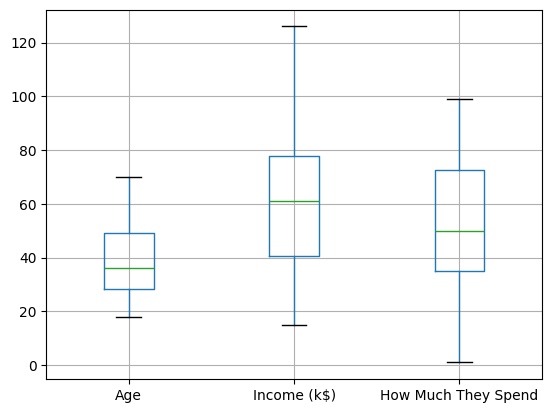

In [134]:
customer.boxplot(column=[ "Age", "Income (k$)", "How Much They Spend"])
plt.show()

Now, there is no more outliers.

### **Visuallizing the Data**

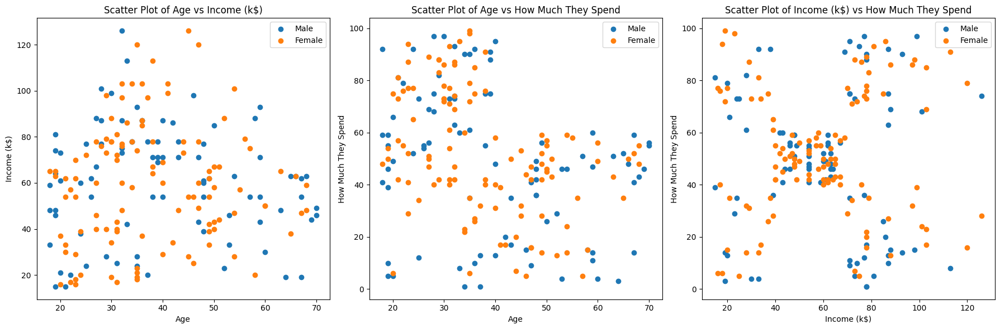

In [135]:
features = ["Age", "Income (k$)", "How Much They Spend"]
fig, axes = plt.subplots(1, 3, figsize=(18, 6))  # Create a single row with 3 subplots

ax_no = 0
for i in range(len(features)):
    for j in range(i+1, len(features)):
        ax = axes[ax_no]
        ax_no += 1  # Select the appropriate subplot
        ax.scatter(customer[customer["Gender"] == "Male"][features[i]], customer[customer["Gender"] == "Male"][features[j]], label="Male")
        ax.scatter(customer[customer["Gender"] == "Female"][features[i]], customer[customer["Gender"] == "Female"][features[j]], label="Female")
        ax.set_title(f"Scatter Plot of {features[i]} vs {features[j]}")
        ax.set_xlabel(features[i])
        ax.set_ylabel(features[j])
        ax.legend()

plt.tight_layout()
plt.show()

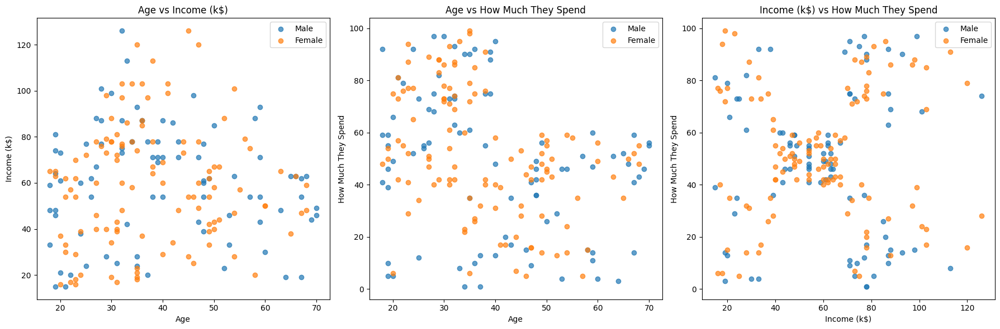

In [136]:
import itertools

features = ["Age", "Income (k$)", "How Much They Spend"]

# Generate all combinations of feature pairs
feature_combinations = list(itertools.combinations(features, 2))
n_plots = len(feature_combinations)

# Determine subplot grid size (e.g., 2x2, 3x3) based on the number of plots
cols = 3  # Set a fixed number of columns
rows = -(-n_plots // cols)  # Ceiling division to determine rows

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 6 * rows))  # Create subplots grid
axes = axes.flatten()  # Flatten the 2D array of axes to a 1D array for easy iteration

for idx, (feature_x, feature_y) in enumerate(feature_combinations):
    ax = axes[idx]
    ax.scatter(
        customer[customer["Gender"] == "Male"][feature_x],
        customer[customer["Gender"] == "Male"][feature_y],
        label="Male",
        alpha=0.7
    )
    ax.scatter(
        customer[customer["Gender"] == "Female"][feature_x],
        customer[customer["Gender"] == "Female"][feature_y],
        label="Female",
        alpha=0.7
    )
    ax.set_title(f"{feature_x} vs {feature_y}")
    ax.set_xlabel(feature_x)
    ax.set_ylabel(feature_y)
    ax.legend()

# Hide any unused subplots if the grid is larger than needed
for ax in axes[n_plots:]:
    ax.axis('off')

plt.tight_layout()  # Adjust spacing
plt.show()

### Gender Usability
The above graph shows that both genders overlap in all characteristics which appear to show that Gender is not able to make natural groupings and cluster

In [137]:
customer = customer.drop(["Gender","CustomerID"], axis=1)

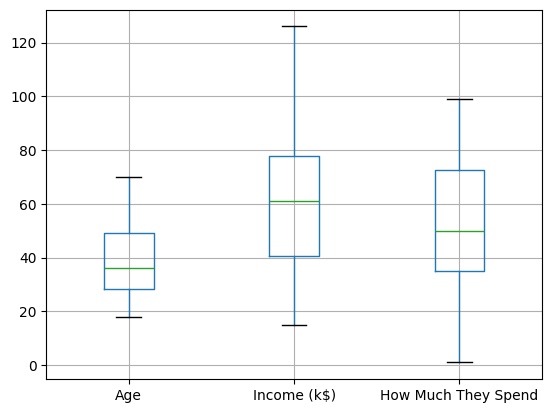

In [138]:
customer.boxplot()
plt.show()

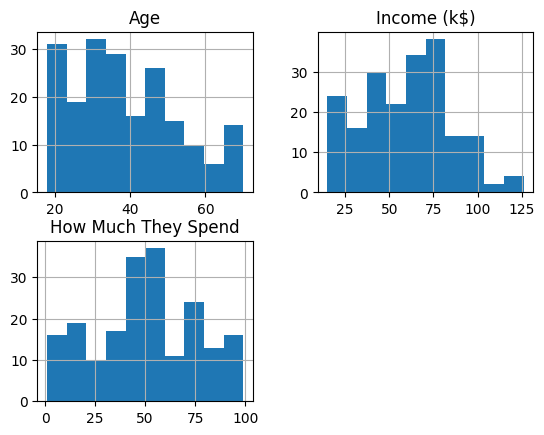

In [139]:
customer.hist()
plt.show()

### Feature Engineering
---
#### Spending to Income Ratio

In [140]:
customer['SpendingToIncomeRatio'] = customer['How Much They Spend'] / customer['Income (k$)']

## Standardizing

In [141]:
stdScaler = StandardScaler().fit(customer[["Age", "Income (k$)", "How Much They Spend",'SpendingToIncomeRatio']])
customer_std = stdScaler.transform(customer[["Age", "Income (k$)", "How Much They Spend",'SpendingToIncomeRatio']])
minmaxScaler = MinMaxScaler().fit(customer[["Age", "Income (k$)", "How Much They Spend",'SpendingToIncomeRatio']])
customer_minmax = minmaxScaler.transform(customer[["Age", "Income (k$)", "How Much They Spend",'SpendingToIncomeRatio']])
# converting to dataframe
customer_std = pd.DataFrame(customer_std, columns=["Age", "Income", "SpendingAmount",'SpendingToIncomeRatio'])
customer_minmax = pd.DataFrame(customer_minmax, columns=["Age", "Income", "SpendingAmount",'SpendingToIncomeRatio'])

customer_pca_model_2_std = PCA(n_components=2).fit(customer_std)
customer_pca_2_std = customer_pca_model_2_std.transform(customer_std)
customer_pca_2_std = pd.DataFrame(customer_pca_2_std, columns=["PC1", "PC2"])
customer_pca_model_3_std = PCA(n_components=3).fit(customer_std)
customer_pca_3_std = customer_pca_model_3_std.transform(customer_std)
customer_pca_3_std = pd.DataFrame(customer_pca_3_std, columns=["PC1", "PC2", "PC3"])

customer_pca_model_2_minmax = PCA(n_components=2).fit(customer_minmax)
customer_pca_2_minmax = customer_pca_model_2_minmax.transform(customer_minmax)
customer_pca_2_minmax = pd.DataFrame(customer_pca_2_minmax, columns=["PC1", "PC2"])
customer_pca_model_3_minmax = PCA(n_components=3).fit(customer_minmax)
customer_pca_3_minmax = customer_pca_model_3_minmax.transform(customer_minmax)
customer_pca_3_minmax = pd.DataFrame(customer_pca_3_minmax, columns=["PC1", "PC2", "PC3"])

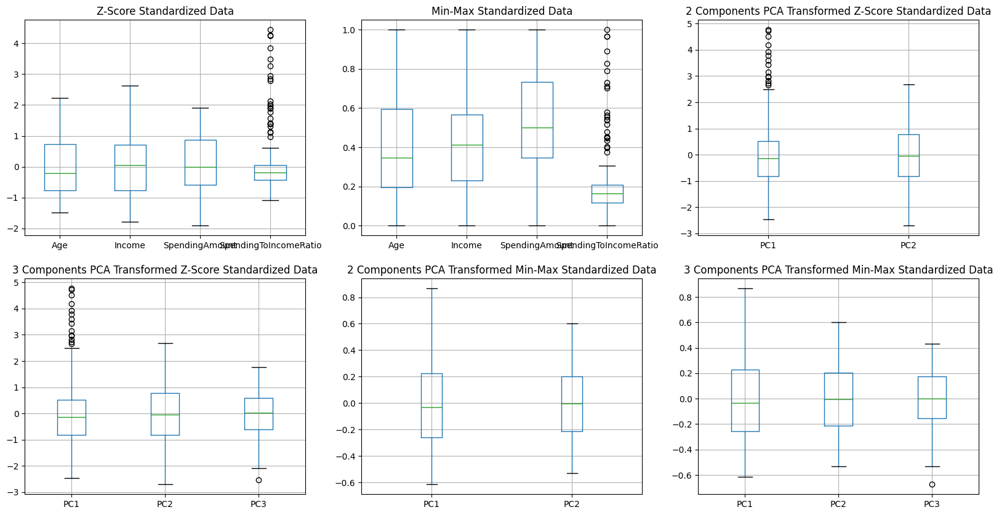

In [142]:
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

# Now you can access each subplot by indexing into the `axes` array
customer_std.boxplot(ax=axes[0, 0])
axes[0, 0].set_title("Z-Score Standardized Data")
customer_minmax.boxplot(ax=axes[0, 1])
axes[0, 1].set_title("Min-Max Standardized Data")
customer_pca_2_std.boxplot(ax=axes[0, 2])
axes[0, 2].set_title("2 Components PCA Transformed Z-Score Standardized Data")
customer_pca_3_std.boxplot(ax=axes[1, 0])
axes[1, 0].set_title("3 Components PCA Transformed Z-Score Standardized Data")
customer_pca_2_minmax.boxplot(ax=axes[1, 1])
axes[1, 1].set_title("2 Components PCA Transformed Min-Max Standardized Data")
customer_pca_3_minmax.boxplot(ax=axes[1, 2])
axes[1, 2].set_title("3 Components PCA Transformed Min-Max Standardized Data")

plt.show()

There is outlier for btoh standardized data.
Therefore, I will make new dataframe with no outlier.

In [143]:
def remove_outlier(df):
    df_cleaned = df.copy()  # Make a copy to avoid modifying the original DataFrame
    
    for col in df_cleaned.select_dtypes(include=['number']).columns:  # Process only numeric columns
        Q1 = df_cleaned[col].quantile(0.25)
        Q3 = df_cleaned[col].quantile(0.75)
        IQR = Q3 - Q1

        # Define bounds for outliers
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Remove outliers for the current column
        df_cleaned = df_cleaned[(df_cleaned[col] >= lower_bound) & (df_cleaned[col] <= upper_bound)]
    
    return df_cleaned

customer_std_no_outliers = remove_outlier(customer_std)
customer_minmax_no_outliers = remove_outlier(customer_minmax)


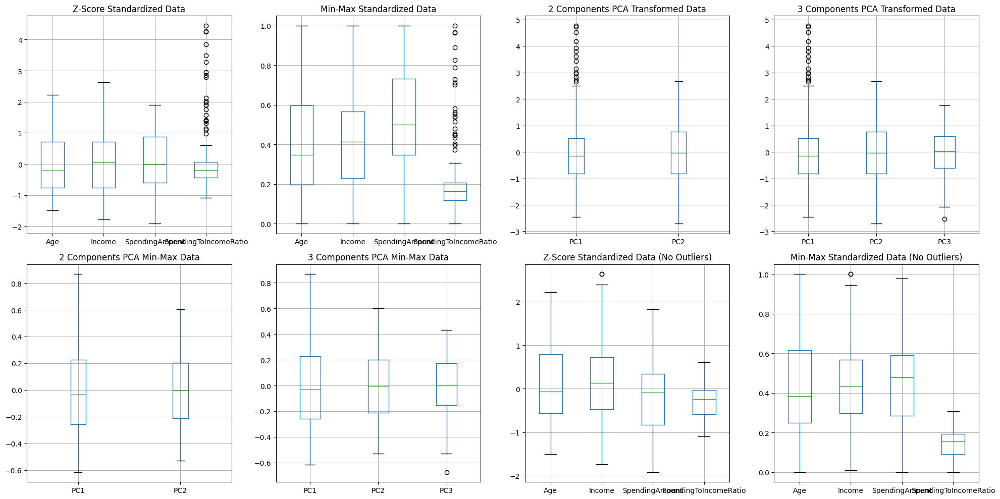

In [144]:
fig, ax = plt.subplots(2, 4, figsize=(20,10)) 

customer_std.boxplot(ax=ax[0,0])
ax[0,0].set_title("Z-Score Standardized Data")
customer_minmax.boxplot(ax=ax[0,1])
ax[0,1].set_title("Min-Max Standardized Data")
customer_pca_2_std.boxplot(ax=ax[0,2])
ax[0,2].set_title("2 Components PCA Transformed Data")
customer_pca_3_std.boxplot(ax=ax[0,3])
ax[0,3].set_title("3 Components PCA Transformed Data")
customer_pca_2_minmax.boxplot(ax=ax[1,0])
ax[1,0].set_title("2 Components PCA Min-Max Data")
customer_pca_3_minmax.boxplot(ax=ax[1,1])
ax[1,1].set_title("3 Components PCA Min-Max Data")
customer_std_no_outliers.boxplot(ax=ax[1,2])
ax[1,2].set_title("Z-Score Standardized Data (No Outliers)")
customer_minmax_no_outliers.boxplot(ax=ax[1,3])
ax[1,3].set_title("Min-Max Standardized Data (No Outliers)")

plt.tight_layout()
plt.show()

### Choosing No. of Clusters

In [145]:
from sklearn.metrics import silhouette_score

def elbow_and_silhouette(data, max_clusters=10):
    # Elbow method
    sse = []
    for k in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        sse.append(kmeans.inertia_)
    
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, max_clusters + 1), sse, marker='o')
    plt.title('Elbow Method')
    plt.xlabel('Number of clusters')
    plt.ylabel('SSE')
    plt.show()
    
    # Silhouette method
    silhouette_avg = []
    for k in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(data)
        silhouette_avg.append(silhouette_score(data, labels))
    
    plt.figure(figsize=(10, 5))
    plt.plot(range(2, max_clusters + 1), silhouette_avg, marker='o')
    plt.title('Silhouette Method')
    plt.xlabel('Number of clusters')
    plt.ylabel('Silhouette Score')
    plt.show()

# There are too many graph which can make it hard to read, so I will comment this out.

# columns = ["Age", "Income", "SpendingAmount", "SpendingToIncomeRatio"]
# for col_pair in itertools.combinations(columns, 2):
#     print(f"Elbow and Silhouette Test for columns: {col_pair}")
    
#     # Perform the tests on standardized data
#     print("On Standardized Data:")
#     elbow_and_silhouette(customer_std[list(col_pair)])
    
#     # Perform the tests on min-max scaled data
#     print("On Min-Max Scaled Data:")
#     elbow_and_silhouette(customer_minmax[list(col_pair)])
    
# for col_pair in itertools.combinations(columns, 3):
#     print(f"Elbow and Silhouette Test for columns: {col_pair}")
    
#     # Perform the tests on standardized data
#     print("On Standardized Data:")
#     elbow_and_silhouette(customer_std[list(col_pair)])
    
#     # Perform the tests on min-max scaled data
#     print("On Min-Max Scaled Data:")
#     elbow_and_silhouette(customer_minmax[list(col_pair)])
# # Perform the tests on standardized data
# print("Elbow and Silhouette Test for Standardized Data (All Columns)")
# elbow_and_silhouette(customer_std)

# # Perform the tests on min-max scaled data
# print("Elbow and Silhouette Test for Min-Max Scaled Data (All Columns)")
# elbow_and_silhouette(customer_minmax)

# # Perform the tests on PCA transformed data
# print("Elbow and Silhouette Test for 2 Components PCA Transformed Data (All Columns)")
# elbow_and_silhouette(customer_pca_2)

# print("Elbow and Silhouette Test for 3 Components PCA Transformed Data (All Columns)")
# elbow_and_silhouette(customer_pca_3)

Optimal Cluster:\
Silhouette: no of cluster at peak value\
Elbow: no of cluster where the decrease in value is not significant.

**Optimal No. Of Cluster** (My Visualization):
- Age & Income: 3
- Age & Spending Amount: 2
- Income & Spending Amount (Standardized): 6
- Income & Spending Amount (Min Max): 5
- All Columns (Standardized): 3
- All Columns (Min Max- elbow): 3,4,5
- All Columns (Min Max- Silhouette): 6
- PCA: 6

My Interpretaion might not be accurate, therefore, I will create a function that determines the optimal number of clusters.

In [146]:
from kneed import KneeLocator
def optimal_clusters(data, max_clusters=10):
    sse = []  # Sum of Squared Errors for Elbow Method
    silhouette_avg = []  # Silhouette Scores
    
    for k in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(data)
        sse.append(kmeans.inertia_)
        silhouette_avg.append(silhouette_score(data, labels))
    
    # Determine optimal clusters using the Elbow Method (KneeLocator)
    knee_locator = KneeLocator(range(2, max_clusters + 1), sse, curve='convex', direction='decreasing')
    optimal_elbow = knee_locator.elbow
    
    # Determine optimal clusters using the Silhouette Score (highest score)
    optimal_silhouette = range(2, max_clusters + 1)[np.argmax(silhouette_avg)]
    
    
    print(f"Elbow Method: {optimal_elbow}")
    print(f"Silhouette Score: {optimal_silhouette}")
    


columns = ["Age", "Income", "SpendingAmount", "SpendingToIncomeRatio"]
df = customer_data = {
    "standardized Data": customer_std,
    "minmax_scaled Data": customer_minmax,
    "standardized_no_outliers Data": customer_std_no_outliers,
    "minmax_scaled_no_outliers Data": customer_minmax_no_outliers
}
for col_pair in itertools.combinations(columns, 2):
    print(f"Elbow and Silhouette Test for columns: {col_pair}")
    
    for index, i in enumerate(df):
        print(f"{list(df.keys())[index]}")
        optimal_clusters(df[i][list(col_pair)])
    
for col_pair in itertools.combinations(columns, 3):
    print(f"Elbow and Silhouette Test for columns: {col_pair}")
    
    for index, i in enumerate(df):
        print(f"{list(df.keys())[index]}")
        optimal_clusters(df[i][list(col_pair)])
    
# Perform the tests on standardized data
print("Elbow and Silhouette Test for Standardized Data (All Columns)")
optimal_clusters(customer_std)

# Perform the tests on min-max scaled data
print("Elbow and Silhouette Test for Min-Max Scaled Data (All Columns)")
optimal_clusters(customer_minmax)

print("Elbow and Silhouette Test for Standardized Data_No_Outlier(All Columns)")
optimal_clusters(customer_std)

# Perform the tests on min-max scaled data
print("Elbow and Silhouette Test for Min-Max Scaled Data_No_Outlier(All Columns)")
optimal_clusters(customer_minmax)

# Perform the tests on PCA transformed data
print("Elbow and Silhouette Test for 2 Components PCA Transformed Standardized Data (All Columns)")
optimal_clusters(customer_pca_2_std)

print("Elbow and Silhouette Test for 3 Components PCA Transformed Standardized Data (All Columns)")
optimal_clusters(customer_pca_3_std)

print("Elbow and Silhouette Test for 2 Components PCA Transformed Minmax Data (All Columns)")
optimal_clusters(customer_pca_2_minmax)

print("Elbow and Silhouette Test for 3 Components PCA Transformed Minmax Data (All Columns)")
optimal_clusters(customer_pca_3_minmax)

Elbow and Silhouette Test for columns: ('Age', 'Income')
standardized Data
Elbow Method: 4
Silhouette Score: 3
minmax_scaled Data
Elbow Method: 4
Silhouette Score: 3
standardized_no_outliers Data
Elbow Method: 5
Silhouette Score: 2
minmax_scaled_no_outliers Data
Elbow Method: 5
Silhouette Score: 2
Elbow and Silhouette Test for columns: ('Age', 'SpendingAmount')
standardized Data
Elbow Method: 4
Silhouette Score: 2
minmax_scaled Data
Elbow Method: 4
Silhouette Score: 2
standardized_no_outliers Data
Elbow Method: 4
Silhouette Score: 7
minmax_scaled_no_outliers Data
Elbow Method: 4
Silhouette Score: 7
Elbow and Silhouette Test for columns: ('Age', 'SpendingToIncomeRatio')
standardized Data
Elbow Method: 3
Silhouette Score: 2
minmax_scaled Data
Elbow Method: 4
Silhouette Score: 3
standardized_no_outliers Data
Elbow Method: 5
Silhouette Score: 2
minmax_scaled_no_outliers Data
Elbow Method: 4
Silhouette Score: 2
Elbow and Silhouette Test for columns: ('Income', 'SpendingAmount')
standardized

Based on the optimal cluster gotten from elbow and silhouette score, we can see that that for most dataset, the optimal cluster is 4 or 5 but there are some with 2, 3, 7 and 9 clusters.

## Graph Visualization
---

### Standard K-Means Model to visualize relationship

In [147]:
# list to append all models
models = []

# Define KMeans with different n_clusters
kmeans_params = [1, 2, 3, 4, 5, 6, 7, 9]
for n_clusters in kmeans_params:
    models.append(KMeans(n_clusters=n_clusters))

In [148]:
# function to get clusters
def cluster_data(data, model):
    labels = model.fit_predict(data)
    return labels

In [149]:
def create_list_of_predictions(data, models):
    prediction = {}
    
    num_columns = [2, 3, len(data.columns)]  # Use pairs, triplets, and all columns
    
    for num_cols in num_columns:
        for cols in itertools.combinations(data.columns, num_cols):
            for model in models:
                labels = cluster_data(data[list(cols)], model)
                key = f"{'🔯'.join(cols)}🔯{model}"
                prediction[key] = labels
    
    return prediction

In [150]:

# Create predictions for the standard-scaled customer data
prediction_std = create_list_of_predictions(customer_std, models)

# Create predictions for the min-max scaled customer data
prediction_minmax = create_list_of_predictions(customer_minmax, models)

# Create predictions for the PCA-reduced (2 components) and standard-scaled customer data
prediction_pca_2_std = create_list_of_predictions(customer_pca_2_std, models)

# Create predictions for the PCA-reduced (3 components) and standard-scaled customer data
prediction_pca_3_std = create_list_of_predictions(customer_pca_3_std, models)

# Create predictions for the PCA-reduced (2 components) and min-max scaled customer data
prediction_pca_2_minmax = create_list_of_predictions(customer_pca_2_minmax, models)

# Create predictions for the PCA-reduced (3 components) and min-max scaled customer data
prediction_pca_3_minmax = create_list_of_predictions(customer_pca_3_minmax, models)

# Create predictions for the standard-scaled customer data without outliers
prediction_std_no_outliers = create_list_of_predictions(customer_std_no_outliers, models)

# Create predictions for the min-max scaled customer data without outliers
prediction_minmax_no_outliers = create_list_of_predictions(customer_minmax_no_outliers, models)



In [151]:
# function to show all graph
def compute_graph(data, prediction):
    plt.clf()
    # Determine the number of rows needed
    num_keys = len(prediction)
    num_rows = (num_keys + 3) // 4  # 5 columns per row

    # Create subplots
    fig, axes = plt.subplots(num_rows, 4, figsize=(20, 5 * num_rows))
    axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration
    for i, (key, values) in enumerate(prediction.items()):
        ax = axes[i]
        columns = key.split('🔯')[:-1]  # Exclude 'model' part
        
        if len(columns) == 2:
            # 2D scatter plot
            ax.scatter(data[columns[0]], data[columns[1]], c=values, cmap='viridis')
            ax.set_xlabel(columns[0])
            ax.set_ylabel(columns[1])
            ax.set_title(key, fontsize=8)
        
        elif len(columns) in [3, 4]:
            # Apply t-SNE for dimensionality reduction to 2D
            feature_data = data[columns].values
            tsne = TSNE(n_components=2, random_state=42)
            transformed_data = tsne.fit_transform(feature_data)
            
            ax.scatter(transformed_data[:, 0], transformed_data[:, 1], c=values, cmap='viridis')
            ax.set_xlabel("TSNE Component 1")
            ax.set_ylabel("TSNE Component 2")
            wrapped_title = "\n".join(textwrap.wrap(key, width=20))  # Adjust width as needed
            ax.set_title(wrapped_title, fontsize=10)
        else:
            feature_data = data[columns].values
            tsne = TSNE(n_components=2, random_state=42)
            transformed_data = tsne.fit_transform(feature_data)
            
            ax.scatter(transformed_data[:, 0], transformed_data[:, 1], c=values, cmap='viridis')
            ax.set_xlabel("TSNE Component 1")
            ax.set_ylabel("TSNE Component 2")
            wrapped_title = "\n".join(textwrap.wrap(key, width=20))  # Adjust width as needed
            ax.set_title(wrapped_title, fontsize=10)

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

In [152]:
# # Compute and visualize the graph for standard-scaled customer data
# compute_graph(customer_std, prediction_std)

# # Compute and visualize the graph for min-max scaled customer data
# compute_graph(customer_minmax, prediction_minmax)

# # Compute and visualize the graph for PCA-reduced (2 components) and standard-scaled customer data
# compute_graph(customer_pca_2_std, prediction_pca_2_std)

# # Compute and visualize the graph for PCA-reduced (3 components) and standard-scaled customer data
# compute_graph(customer_pca_3_std, prediction_pca_3_std)

# # Compute and visualize the graph for PCA-reduced (2 components) and min-max scaled customer data
# compute_graph(customer_pca_2_minmax, prediction_pca_2_minmax)

# # Compute and visualize the graph for PCA-reduced (3 components) and min-max scaled customer data
# compute_graph(customer_pca_3_minmax, prediction_pca_3_minmax)

# # Compute and visualize the graph for standard-scaled customer data without outliers
# compute_graph(customer_std_no_outliers, prediction_std_no_outliers)

# # Compute and visualize the graph for min-max scaled customer data without outliers
# compute_graph(customer_minmax_no_outliers, prediction_minmax_no_outliers)

From looking at the graph, The feature I engineered "SpendingToIncomeRatio" doesn't seemed to make good cluster.
Therefore, I will check if it is good for clustering.

### Deciding whether SpendingToIncomeRatio contributes to clustering

In [153]:
print("Variance of Spending to Income Ratio (with outliers):", np.var(customer_std["SpendingToIncomeRatio"]))
print("Variance of Spending to Income Ratio:", np.var(customer_std_no_outliers["SpendingToIncomeRatio"]))

print("\nData with Spending to Income Ratio:\n")
pca = PCA(n_components=4)

pca.fit(customer_std)
print("Explained Variance Ratios (with outliers):", pca.explained_variance_ratio_)
print("PCA Components:\n", np.round(pca.components_, 3))
pca.fit(customer_std_no_outliers)
print("Explained Variance Ratios:", pca.explained_variance_ratio_)
print("PCA Components:\n", np.round(pca.components_, 3))

print("\nData without Spending to Income Ratio:\n")
pca = PCA(n_components=3)

pca.fit(customer_std[['Age', 'Income', 'SpendingAmount']])
print("Explained Variance Ratios (with outliers):", pca.explained_variance_ratio_)
print("PCA Components:\n", np.round(pca.components_, 3))
pca.fit(customer_std_no_outliers[['Age', 'Income', 'SpendingAmount']])
print("Explained Variance Ratios:", pca.explained_variance_ratio_)
print("PCA Components:\n", np.round(pca.components_, 3))

Variance of Spending to Income Ratio (with outliers): 1.0
Variance of Spending to Income Ratio: 0.15249127424168854

Data with Spending to Income Ratio:

Explained Variance Ratios (with outliers): [0.49859623 0.28625658 0.17504889 0.0400983 ]
PCA Components:
 [[-0.39  -0.378  0.521  0.659]
 [-0.491  0.747  0.408 -0.185]
 [ 0.774  0.228  0.575  0.135]
 [ 0.086  0.497 -0.482  0.717]]
Explained Variance Ratios: [0.47190195 0.27523481 0.24719353 0.00566971]
PCA Components:
 [[-0.612  0.461  0.632  0.111]
 [ 0.453 -0.431  0.689  0.366]
 [ 0.648  0.738  0.115 -0.149]
 [-0.002  0.238 -0.335  0.912]]

Data without Spending to Income Ratio:

Explained Variance Ratios (with outliers): [0.44315646 0.33342311 0.22342043]
PCA Components:
 [[-0.707  0.012  0.707]
 [ 0.031  0.999  0.013]
 [ 0.707 -0.031  0.707]]
Explained Variance Ratios: [0.49329031 0.26850733 0.23820236]
PCA Components:
 [[ 0.626 -0.494 -0.603]
 [ 0.77   0.265  0.581]
 [ 0.127  0.828 -0.546]]


The variance for Spending to Income Ratio is low without outliers suggesting it does not separate cluster well.\
From looking at the PCA with and without **"Spending To Income Ratio"**, it shows that **"Spending To Income Ratio"** contributes at most 0.57% which is very low.\
Therefore, it should be better to use without it.

#### Remove SpendingToIncomeRatio
---

In [154]:
# remove SpendingToIncomeRatio
customer = customer.drop("SpendingToIncomeRatio", axis=1)

## Chosen Features
---

Based on the PCA results, Age, Income and Spending all appear to contribute to the clustering.\
Therefore, I will use all 3 of them in my clustering model.

In [155]:
# recreate dataframe
std_scaler = StandardScaler().fit(customer[["Age", "Income (k$)", "How Much They Spend"]])
customer_std = std_scaler.transform(customer[["Age", "Income (k$)", "How Much They Spend"]])
minmax_scaler = MinMaxScaler().fit(customer[["Age", "Income (k$)", "How Much They Spend"]])
customer_minmax = minmax_scaler.transform(customer[["Age", "Income (k$)", "How Much They Spend"]])

customer_std = pd.DataFrame(customer_std, columns=["Age", "Income", "SpendingAmount"])
customer_minmax = pd.DataFrame(customer_minmax, columns=["Age", "Income", "SpendingAmount"])

In [156]:
# new function to only look at all features and create prediction
def create_predictions_by_model(data, models):
    prediction = {}
    
    for cols in itertools.combinations(data.columns, 3):
            for model in models:
                labels = cluster_data(data[list(cols)], model)
                key = f"{'🔯'.join(cols)}🔯{model}"
                prediction[key] = labels
    
    return prediction

In [157]:
prediction_std = create_predictions_by_model(customer_std, models)
prediction_minmax = create_predictions_by_model(customer_minmax, models)

In [158]:

df = customer_data = {
    "standardized Data": customer_std,
    "minmax_scaled Data": customer_minmax
}
for index, i in enumerate(df):
    print(f"{list(df.keys())[index]}")
    optimal_clusters(df[i])

standardized Data
Elbow Method: 5
Silhouette Score: 6
minmax_scaled Data
Elbow Method: 5
Silhouette Score: 9


C:\Users\kaung\AppData\Local\Temp\ipykernel_24732\882840510.py:48: UserWarning: Glyph 128303 (\N{SIX POINTED STAR WITH MIDDLE DOT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


<Figure size 640x480 with 0 Axes>

C:\Users\kaung\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128303 (\N{SIX POINTED STAR WITH MIDDLE DOT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


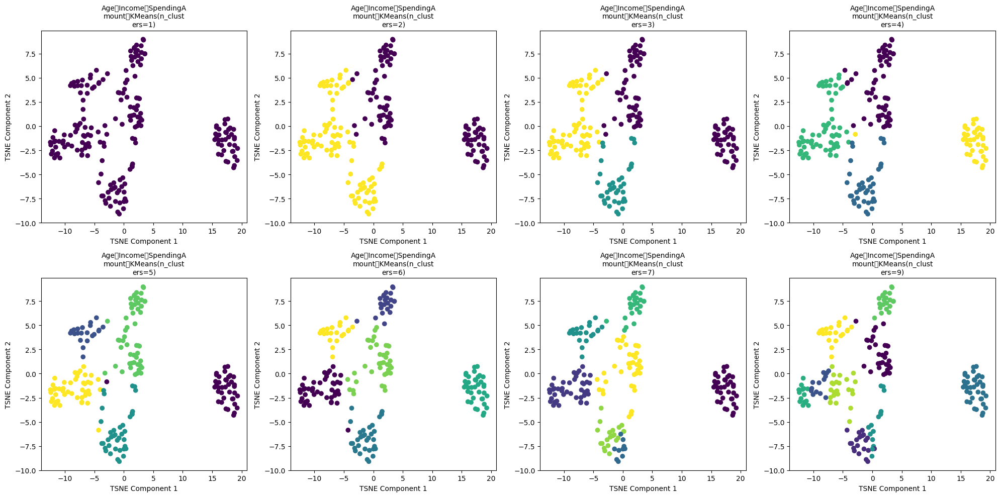

C:\Users\kaung\AppData\Local\Temp\ipykernel_24732\882840510.py:48: UserWarning: Glyph 128303 (\N{SIX POINTED STAR WITH MIDDLE DOT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


<Figure size 640x480 with 0 Axes>

C:\Users\kaung\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128303 (\N{SIX POINTED STAR WITH MIDDLE DOT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


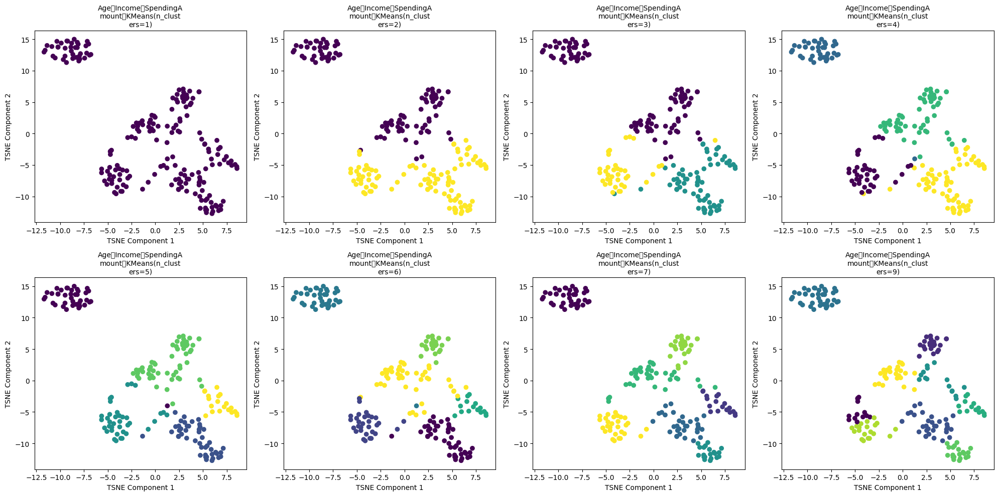

In [159]:
# # Compute and visualize the graph for standard-scaled customer data
compute_graph(customer_std, prediction_std)

# # Compute and visualize the graph for min-max scaled customer data
compute_graph(customer_minmax, prediction_minmax)

Based on the graph, both the Standard Scaled and Min-Max Scaled data appear to form 5 or 6 clusters.\
However, the clusters in the Standard Scaled data are more distinct and clearer.\
As a result, I have decided to choose the Standard Scaled data but before I confirmed let me check its silhouette score.

## Chosing Standardizing Method

In [160]:
from sklearn.metrics import silhouette_score

def silhouette_scores(data, predictions, cluster_numbers=[5, 6]):
    for cluster_num in cluster_numbers:
        key = f"Age🔯Income🔯SpendingAmount🔯KMeans(n_clusters={cluster_num})"
        if key in predictions:
            labels = predictions[key]
            score = silhouette_score(data, labels)
            print(f"Silhouette Score for {cluster_num} clusters: {score}")
        else:
            print(f"No predictions found for {cluster_num} clusters")

# Example usage:
print("Standardized Data:")
silhouette_scores(customer_std, prediction_std)
print("\nMin-Max Scaled Data:")
silhouette_scores(customer_minmax, prediction_minmax)

Standardized Data:
Silhouette Score for 5 clusters: 0.42154499815263285
Silhouette Score for 6 clusters: 0.4334778776406824

Min-Max Scaled Data:
Silhouette Score for 5 clusters: 0.4128428517802903
Silhouette Score for 6 clusters: 0.4253332947824705


As you can see the best silhouette score is 0.437 for Standardized Data with 5 clusters.
Therefore, I will be using Standardized Data.

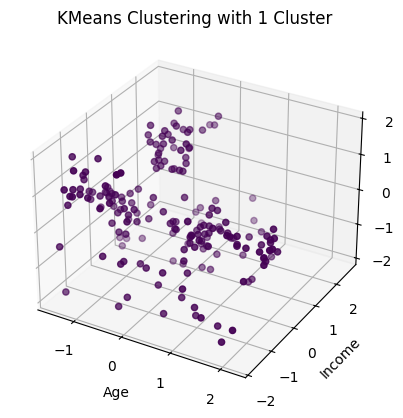

In [161]:
from mpl_toolkits.mplot3d import Axes3D

import matplotlib.pyplot as plt
# %matplotlib tk
labels = prediction_std["Age🔯Income🔯SpendingAmount🔯KMeans(n_clusters=1)"]

# Create a 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
ax.scatter(customer_std['Age'], customer_std['Income'], customer_std['SpendingAmount'], c=labels, cmap='viridis')

# Set labels
ax.set_xlabel('Age')
ax.set_ylabel('Income')
ax.set_zlabel('Spending Amount')
ax.set_title('KMeans Clustering with 1 Cluster')

# Show plot in a separate window
plt.show()

# Model Selection

#### DB SCANS
---

In [162]:
DBSCAN_models = []

# Define the extended parameter grid with valid combinations of metric and algorithm
param_grid = {
    'eps': np.arange(0.5, 0.6, 0.01),
    'min_samples': [2, 3, 4, 5, 6, 7, 8],
    'metric': ['euclidean'],  # Exclude 'cosine' from here for compatibility
    'algorithm': ['auto', 'ball_tree', 'kd_tree'],  # Exclude 'brute' from here if 'cosine' is used
}
for eps in param_grid['eps']:
    for min_samples in param_grid['min_samples']:
        for metric in param_grid['metric']:
            for algorithm in param_grid['algorithm']:
                model = DBSCAN(eps=eps, min_samples=min_samples, metric=metric, algorithm=algorithm)
                DBSCAN_models.append(model)

In [163]:
prediction_std_db = create_predictions_by_model(customer_std, DBSCAN_models)

In [164]:
# Compute and visualize the graph for standard-scaled customer data
compute_graph(customer_std, prediction_std_db)

C:\Users\kaung\AppData\Local\Temp\ipykernel_24732\882840510.py:48: UserWarning: Glyph 128303 (\N{SIX POINTED STAR WITH MIDDLE DOT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


<Figure size 640x480 with 0 Axes>

C:\Users\kaung\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128303 (\N{SIX POINTED STAR WITH MIDDLE DOT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


In [165]:
def best_model_finder(customer_std, prediction_std_db):
    best_model = None
    best_score = -1  # Silhouette scores range from -1 to 1

    for model_name, labels in prediction_std_db.items():
        unique_labels = set(labels)

        # Silhouette score is only valid if there are at least 2 clusters
        if len(unique_labels) > 1 and -1 in unique_labels and len(unique_labels) > 2:
            unique_labels.discard(-1)  # Ignore noise points (-1) in DBSCAN

        if len(unique_labels) > 1:  # Ensure we have at least 2 clusters
            score = silhouette_score(customer_std, labels)
            if score > best_score:
                best_score = score
                best_model = model_name

    return best_model, best_score

best_model, best_score = best_model_finder(customer_std, prediction_std_db)
print(f"Best DBSCAN Model: {best_model}")
print(f"Best Silhouette Score: {best_score}")

Best DBSCAN Model: Age🔯Income🔯SpendingAmount🔯DBSCAN(eps=0.5900000000000001, min_samples=7)
Best Silhouette Score: 0.2756260880804654


Since the highest silhouette score for DBSCAN is 0.276, which is significantly lower than the 0.422 achieved by K-Means (5), this indicates that DBSCAN is not a suitable model for this dataset.

#### Gaussian Mixture Models (GMM) 
---

In [166]:
# Define the parameter grid for Gaussian Mixture Models (GMM)
gmm_params = {
    'n_components': [5, 6],
    'covariance_type': ['full', 'tied', 'diag', 'spherical'],
    'init_params': ['kmeans'],
    'tol': [1e-3, 1e-4, 1e-5],
}

# Create a list to store GMM models
GMM_models = []

# Generate GMM models with different parameter combinations
for n_components in gmm_params['n_components']:
    for covariance_type in gmm_params['covariance_type']:
        for init_params in gmm_params['init_params']:
            for tol in gmm_params['tol']:
                model = GaussianMixture(n_components=n_components, covariance_type=covariance_type, init_params=init_params, tol=tol, random_state=42)
                GMM_models.append(model)


In [167]:
# Create predictions for the standard-scaled customer data using GMM models
prediction_std_gmm = create_predictions_by_model(customer_std, GMM_models)

In [168]:
print(customer_std.head())

        Age    Income  SpendingAmount
0 -1.425414 -1.779171       -0.435989
1 -1.282367 -1.779171        1.199413
2 -1.353890 -1.739447       -1.720949
3 -1.139319 -1.739447        1.043661
4 -0.567131 -1.699723       -0.397051


C:\Users\kaung\AppData\Local\Temp\ipykernel_24732\882840510.py:48: UserWarning: Glyph 128303 (\N{SIX POINTED STAR WITH MIDDLE DOT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


<Figure size 640x480 with 0 Axes>

C:\Users\kaung\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128303 (\N{SIX POINTED STAR WITH MIDDLE DOT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


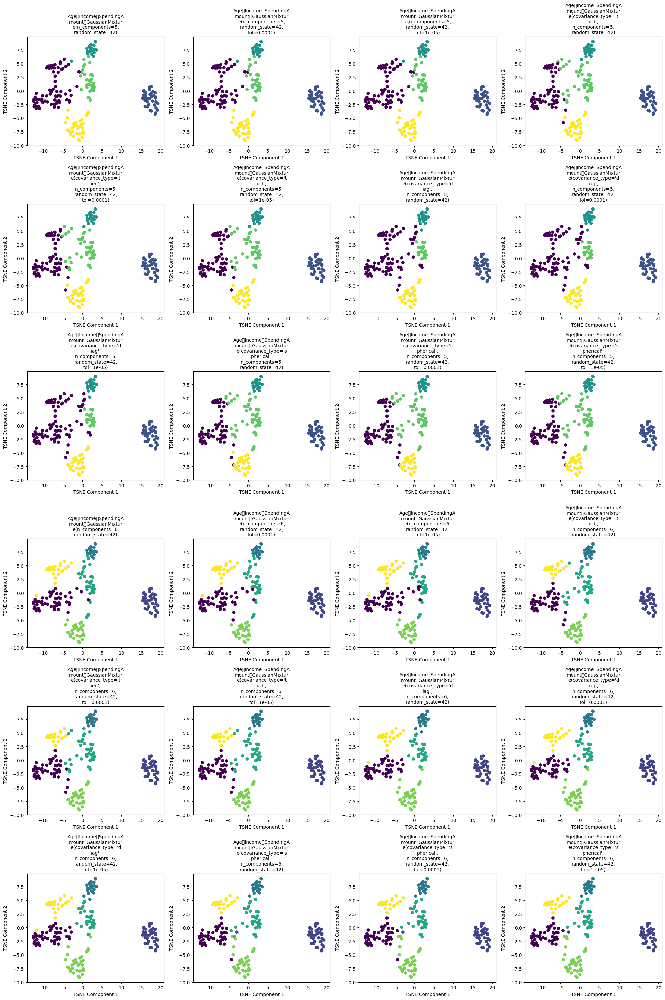

In [169]:
# Compute and visualize the graph for standard-scaled customer data using GMM models
compute_graph(customer_std, prediction_std_gmm)

In [170]:
best_model, best_score = best_model_finder(customer_std, prediction_std_gmm)
print(f"Best GMM Model: {best_model}")
print(f"Best Silhouette Score: {best_score}")

Best GMM Model: Age🔯Income🔯SpendingAmount🔯GaussianMixture(covariance_type='tied', n_components=6, random_state=42)
Best Silhouette Score: 0.4336710832421218


#### Agglomerative Clustering
---

In [171]:
# Define the parameter grid for Agglomerative Clustering
agglo_params = {
    'n_clusters': [5, 6],
    'metric': ['euclidean', 'manhattan', 'cosine'],
    'linkage': ['ward', 'complete', 'average', 'single']
}

# Create a list to store Agglomerative Clustering models
Agglo_models = []

# Generate Agglomerative Clustering models with different parameter combinations
for n_clusters in agglo_params['n_clusters']:
    for metric in agglo_params['metric']:
        for linkage in agglo_params['linkage']:
            if linkage == 'ward' and metric != 'euclidean':
                continue  # Ward linkage only works with Euclidean metric
            model = AgglomerativeClustering(n_clusters=n_clusters, metric=metric, linkage=linkage)
            Agglo_models.append(model)


In [172]:
# Create predictions for the standard-scaled customer data using Agglomerative Clustering models
prediction_std_agglo = create_predictions_by_model(customer_std, Agglo_models)


C:\Users\kaung\AppData\Local\Temp\ipykernel_24732\882840510.py:48: UserWarning: Glyph 128303 (\N{SIX POINTED STAR WITH MIDDLE DOT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


<Figure size 640x480 with 0 Axes>

C:\Users\kaung\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128303 (\N{SIX POINTED STAR WITH MIDDLE DOT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


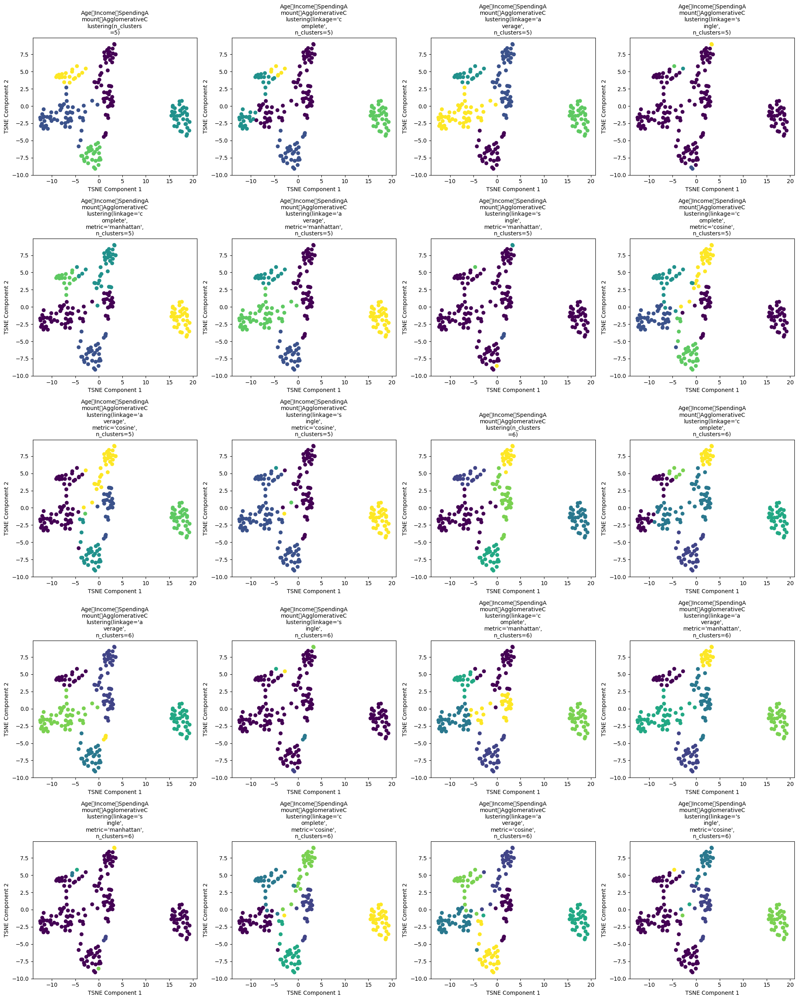

In [173]:
# Compute and visualize the graph for standard-scaled customer data using Agglomerative Clustering models
compute_graph(customer_std, prediction_std_agglo)

In [174]:
# Find the best model based on silhouette score
best_model, best_score = best_model_finder(customer_std, prediction_std_agglo)
print(f"Best Agglomerative Clustering Model: {best_model}")
print(f"Best Silhouette Score: {best_score}")

Best Agglomerative Clustering Model: Age🔯Income🔯SpendingAmount🔯AgglomerativeClustering(linkage='average', metric='manhattan', n_clusters=6)
Best Silhouette Score: 0.4264956317944766


Best Agglomerative Clustering Model: Age🔯Income🔯SpendingAmount🔯AgglomerativeClustering(linkage='average', metric='manhattan', n_clusters=6)
Best Silhouette Score: 0.4264956317944766

#### OPTICS
---

In [175]:
from sklearn.cluster import OPTICS

optics_params = {
    'min_samples': [5, 10, 15],
    'max_eps': [0.5, 1.0],
    'metric': ['euclidean', 'manhattan', 'cosine'],
    'cluster_method': ['dbscan', 'xi']
}

optics_models = []

for min_samples in optics_params['min_samples']:
    for max_eps in optics_params['max_eps']:
        for metric in optics_params['metric']:
            for cluster_method in optics_params['cluster_method']:
                # Ensure max_eps is not None for methods that don't support it
                if max_eps is None and cluster_method != 'dbscan':
                    continue  # max_eps=None is not valid for 'xi' method
                model = OPTICS(min_samples=min_samples, max_eps=max_eps, metric=metric, cluster_method=cluster_method)
                optics_models.append(model)

In [176]:
# Create predictions for the standard-scaled customer data using Agglomerative Clustering models
prediction_std_optics = create_predictions_by_model(customer_std, optics_models)

C:\Users\kaung\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\cluster\_optics.py:661: UserWarning: All reachability values are inf. Set a larger max_eps or all data will be considered outliers.
  warnings.warn(
C:\Users\kaung\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\cluster\_optics.py:661: UserWarning: All reachability values are inf. Set a larger max_eps or all data will be considered outliers.
  warnings.warn(


C:\Users\kaung\AppData\Local\Temp\ipykernel_24732\882840510.py:48: UserWarning: Glyph 128303 (\N{SIX POINTED STAR WITH MIDDLE DOT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


<Figure size 640x480 with 0 Axes>

C:\Users\kaung\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128303 (\N{SIX POINTED STAR WITH MIDDLE DOT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


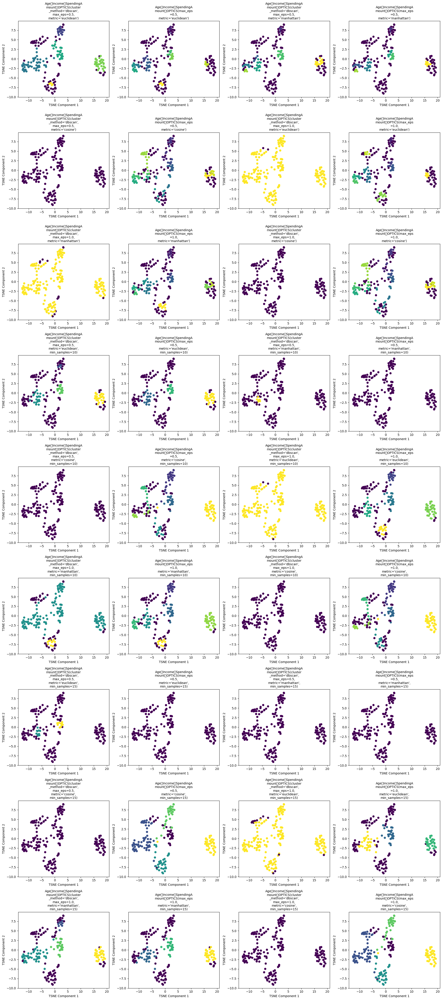

In [177]:
# Compute and visualize the graph for standard-scaled customer data using Agglomerative Clustering models
compute_graph(customer_std, prediction_std_optics)

In [178]:
# Find the best model based on silhouette score
best_model, best_score = best_model_finder(customer_std, prediction_std_optics)
print(f"Best Agglomerative Clustering Model: {best_model}")
print(f"Best Silhouette Score: {best_score}")

Best Agglomerative Clustering Model: Age🔯Income🔯SpendingAmount🔯OPTICS(max_eps=0.5, metric='cosine', min_samples=15)
Best Silhouette Score: 0.3780188565983111


Similar to DBSCAN, the Silhouette Score is 0.378, which is not ideal, so we will exclude it from model selection.

#### Spectral Clustering
---

In [179]:
# Define parameter grid for Spectral Clustering
spectral_params = {
    'n_clusters': [6],  # Number of clusters
    'affinity': ['nearest_neighbors'],  # Types of affinity
    'gamma': np.arange(0.1, 0.3, 0.01),  # Gamma parameter for 'rbf' affinity
}

spectral_models = []

# Iterate over all combinations of parameters
for n_clusters in spectral_params['n_clusters']:
    for affinity in spectral_params['affinity']:
        for gamma in spectral_params['gamma']:
            model = SpectralClustering(n_clusters=n_clusters, affinity=affinity, gamma=gamma)
            spectral_models.append(model)

In [180]:
# Create predictions for the standard-scaled customer data using Spectral Clustering models
prediction_std_spectral = create_predictions_by_model(customer_std, spectral_models)

C:\Users\kaung\AppData\Local\Temp\ipykernel_24732\882840510.py:48: UserWarning: Glyph 128303 (\N{SIX POINTED STAR WITH MIDDLE DOT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


<Figure size 640x480 with 0 Axes>

C:\Users\kaung\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128303 (\N{SIX POINTED STAR WITH MIDDLE DOT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


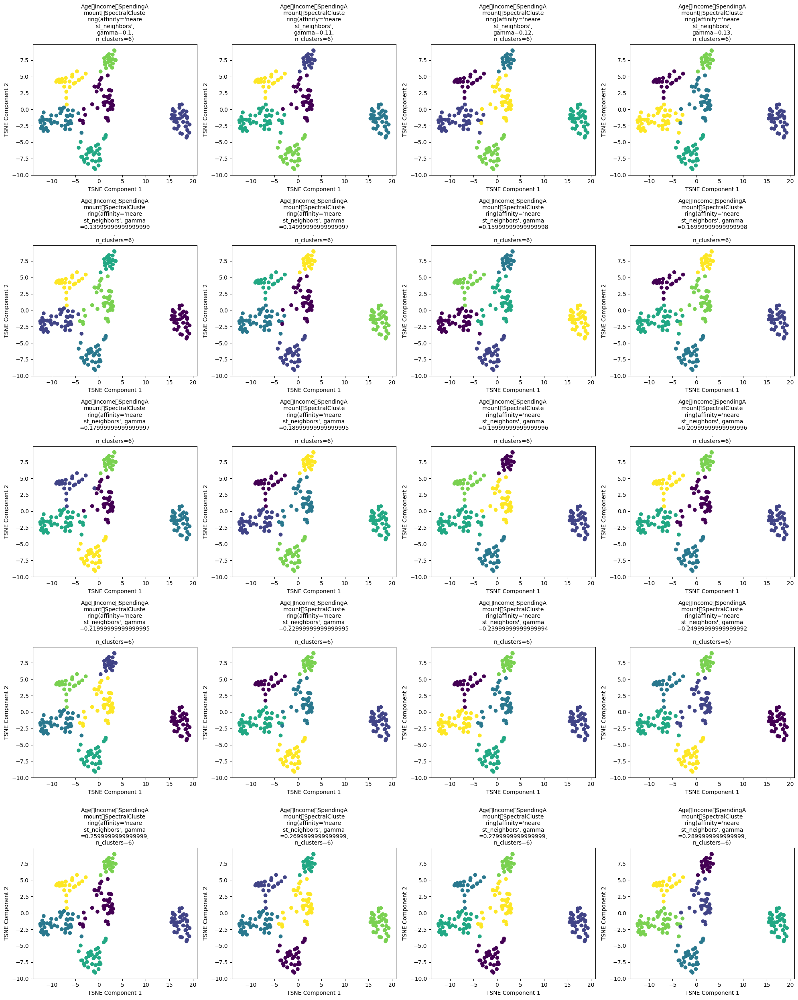

In [181]:
# Compute and visualize the graph for standard-scaled customer data using Mean Shift models
compute_graph(customer_std, prediction_std_spectral)

In [182]:
# Find the best model based on silhouette score
best_model, best_score = best_model_finder(customer_std, prediction_std_spectral)
print(f"Best Mean Shift Model: {best_model}")
print(f"Best Silhouette Score: {best_score}")

Best Mean Shift Model: Age🔯Income🔯SpendingAmount🔯SpectralClustering(affinity='nearest_neighbors', gamma=0.12, n_clusters=6)
Best Silhouette Score: 0.42953940275465713


Best Mean Shift Model: Age🔯Income🔯SpendingAmount🔯SpectralClustering(affinity='nearest_neighbors', gamma=0.21999999999999995,
                   n_clusters=6)
Best Silhouette Score: 0.4302865652177253

# Final Model: KMeans Clustering

After testing different models, the best silhouette score was achieved using **KMeans** with **n_clusters=6**. Therefore, this will be the final model chosen for clustering.

### Chosen Parameters:
- **Model:** KMeans
- **Number of Clusters (n_clusters):** 6

### Silhouette Score:
- **Score:** 0.437

## Final Graph Plot

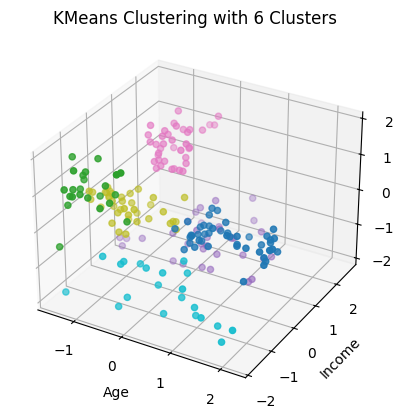

In [183]:
# %matplotlib tk
# Get the labels for KMeans with n_clusters=6
labels_kmeans_6 = prediction_std["Age🔯Income🔯SpendingAmount🔯KMeans(n_clusters=6)"]

# Create a 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
ax.scatter(customer_std['Age'], customer_std['Income'], customer_std['SpendingAmount'], c=labels_kmeans_6, cmap='tab10')

# Set labels
ax.set_xlabel('Age')
ax.set_ylabel('Income')
ax.set_zlabel('Spending Amount')
ax.set_title('KMeans Clustering with 6 Clusters')

# Show plot
plt.show()

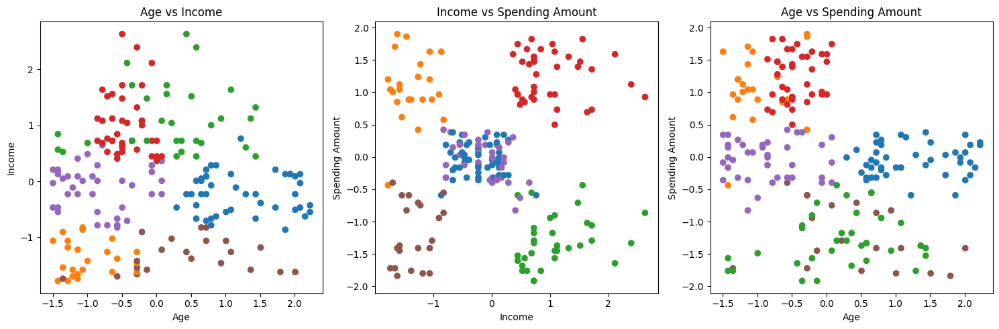

In [192]:
%matplotlib inline
# Get the labels for KMeans with n_clusters=6
final_labels = prediction_std["Age🔯Income🔯SpendingAmount🔯KMeans(n_clusters=6)"]

# Create a 3x1 grid for 2D scatter plots
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

custom_cmap = ListedColormap(['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b'])

# Plot 1: Age vs Income
axes[0].scatter(customer_std['Age'], customer_std['Income'], c=final_labels, cmap=custom_cmap)
axes[0].set_xlabel('Age')
axes[0].set_ylabel('Income')
axes[0].set_title('Age vs Income')

# Plot 2: Income vs Spending Amount
axes[1].scatter(customer_std['Income'], customer_std['SpendingAmount'], c=final_labels, cmap=custom_cmap)
axes[1].set_xlabel('Income')
axes[1].set_ylabel('Spending Amount')
axes[1].set_title('Income vs Spending Amount')

# Plot 3: Age vs Spending Amount
axes[2].scatter(customer_std['Age'], customer_std['SpendingAmount'], c=final_labels, cmap=custom_cmap)
axes[2].set_xlabel('Age')
axes[2].set_ylabel('Spending Amount')
axes[2].set_title('Age vs Spending Amount')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()


In [185]:
# Add the labels to the customer DataFrame
customer['Cluster'] = final_labels

# Print the updated DataFrame
print(customer['Cluster'].unique())

[1 5 0 4 3 2]


#### Creating New Column (Profile)

In [186]:
cluster_to_profile = {
    2: 'Young Poor High-Spender',      # Green
    5: 'Careful Budgeters',  # Red
    1: 'Mature Moderate Spenders',  # Purple
    0: 'Young Moderate Spenders',      # Brown
    3: 'Young Rich High-Spender',  # Blue
    4: 'Middle-Age Rich Low-Spenders'  # Orange
}


# Create the 'Profile' column by mapping values from the 'Cluster' column
customer['Profile'] = customer['Cluster'].map(cluster_to_profile)

#### Clusters Summary

In [187]:
# Group by the 'Profile' column and calculate summary statistics
profile_summary = customer.groupby('Profile').agg({
    'Age': ['mean', 'min', 'max'],
    'Income (k$)': ['mean', 'min', 'max'],
    'How Much They Spend': ['mean', 'min', 'max'],
    'Cluster': 'count'
}).rename(columns={'Cluster': 'Count'})

# Print the summary
profile_summary

Age         Income (k$)           \
                                   mean min max        mean min  max   
Profile                                                                
Careful Budgeters             45.523810  20  67   26.285714  16   39   
Mature Moderate Spenders      25.000000  18  35   25.260870  15   39   
Middle-Age Rich Low-Spenders  27.000000  18  40   56.657895  39   76   
Young Moderate Spenders       56.333333  43  70   54.266667  38   79   
Young Poor High-Spender       41.545455  19  59   87.030303  71  126   
Young Rich High-Spender       32.763158  27  40   85.210526  69  126   

                             How Much They Spend         Count  
                                            mean min max count  
Profile                                                         
Careful Budgeters                      19.380952   3  40    21  
Mature Moderate Spenders               77.608696  39  99    23  
Middle-Age Rich Low-Spenders           49.131579  29  61    38  
Young Moderate Spenders                49.066667  35  60    45  
Young Poor High-Spender                16.727273   1  39    33  
Young Rich High-Spender                82.105263  63  97    38

## Clustering Graph

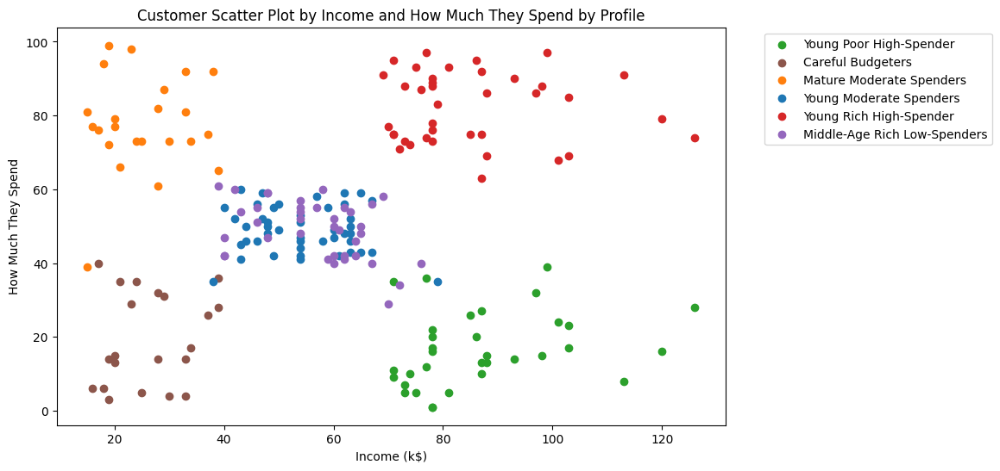

In [ ]:
# Scatter plot of Income vs How Much They Spend, colored by Profile
plt.figure(figsize=(10, 6))

# Define a color map for the profiles
profile_colors = {
    'Young Poor High-Spender': '#2ca02c',      # Green
    'Careful Budgeters': '#8c564b',            # Brown
    'Mature Moderate Spenders': '#ff7f0e',     # Orange
    'Young Moderate Spenders': '#1f77b4',      # Blue
    'Young Rich High-Spender': '#d62728',      # Red
    'Middle-Age Rich Low-Spenders': '#9467bd', # Purple
}

# Plot each profile with a different color
for profile, color in profile_colors.items():
    subset = customer[customer['Profile'] == profile]
    plt.scatter(subset['Income (k$)'], subset['How Much They Spend'], label=profile, color=color)

plt.xlabel('Income (k$)')
plt.ylabel('How Much They Spend')
plt.title('Customer Scatter Plot by Income and How Much They Spend by Profile')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

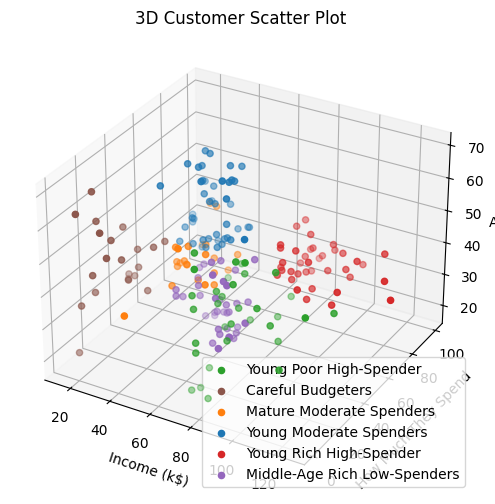

In [189]:
# %matplotlib tk
# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')

# Plot each profile with a different color
for profile, color in profile_colors.items():
    subset = customer[customer['Profile'] == profile]
    ax.scatter(subset['Income (k$)'], subset['How Much They Spend'], subset['Age'], label=profile, color=color)

# Labels and title
ax.set_xlabel('Income (k$)')
ax.set_ylabel('How Much They Spend')
ax.set_zlabel('Age')
ax.set_title('3D Customer Scatter Plot')

plt.legend()
plt.show()

### **Final Conclusion (Catering Strategy)**

#### **Primary Focus: Young Rich High-Spenders**  
- This group **spends twice as much** as the other customer segments.  
- Their **population size is equivalent to the rest of the groups combined**.  
- They have a **high willingness to spend** on premium products.  
- **Ideal Products to Target Them:**  
  - Luxury and high-end gadgets (e.g., flagship smartphones, premium laptops, gaming setups).  
  - High-end fashion and accessories (e.g., designer watches, branded clothing).  
  - Exclusive or limited-edition items.  
  - Premium tech and lifestyle products.  

#### **Secondary Focus: Moderate Spenders**  
- Spend **approximately half** of what high-spenders do.  
- **Larger in number** compared to high-spenders, making them a significant revenue source.  
- While they have **moderate spending power**, they look for **value-for-money products**.  
- **Ideal Products to Target Them:**  
  - Mid-range gadgets (e.g., mid-tier smartphones, laptops, gaming accessories).  
  - Affordable yet quality tech accessories.  
  - Lifestyle and convenience products that offer **great value**.  

#### **Overall Strategy**  
- **Maximize revenue** by prioritizing **luxury and high-end** product offerings for high-spenders.  
- **Capture a larger audience** by supplementing with **mid-range** products for moderate spenders.  
- Maintain a balance between **exclusivity for premium buyers** and **affordable quality for the larger market**.  
- Use **targeted marketing**:  
  - Exclusive branding and premium service for high-spenders.  
  - Promotions and bundle deals for moderate spenders to encourage repeat purchases. 